# Preprocessing and Quality Control of Dementia Cohort NMR Data with the nPYc-Toolbox

This tutorial demonstrates how to use the NMR data processing modules of the nPYc-Toolbox, to import and perform some basic preprocessing and quality control of NMR data, and to output a final high quality dataset ready for data modelling. It is based on the quality control criteria previously described in [Dona et al. 2014](https://www.ncbi.nlm.nih.gov/pubmed/25180432).

Details of how to install all of the required dependencies and to set up your computing environment can be found here [Installing the nPYc-Toolbox](https://npyc-toolbox.readthedocs.io/en/latest/tutorial.html#Installing-the-nPYc-Toolbox).

The dataset used in this example (**ALZ_Urine_Rack01_RCM_221214**) is obtained from the metabolic phenotyping of human urine samples from the dementia research cohort. In this sample set, baseline spot urine samples (first sample collected after recruitment to the study) were collected as part of the AddNeuroMed1 and ART/DCR study consortia, with the aim of identifying biomarkers of neurocognitive decline and Alzheimer’s disease. See [Original Paper](https://doi.org/10.1111/j.1749-6632.2009.05064.x).

The dataset is comprised of human urine samples, aliquoted, prepared independenlty and measured by 1H NMR spectroscopy. A pooled QC sample (study reference, SR) and independent external reference (long-term reference, LTR) of a comparable matrix was also acquired to assist in assessing analytical precision. See the Metabolights Study [MTBLS719](https://www.ebi.ac.uk/metabolights/MTBLS719) for details of the study, and [Recommended Study Design Elements](https://npyc-toolbox.readthedocs.io/en/latest/studydesign.html) for details of the various QC samples acquired.

The [nPYc-toolbox-tutorials]() contain all of the data required to run the tutorial Jupyter notebooks, full details of which are given [here](https://npyc-toolbox.readthedocs.io/en/latest/tutorial.html#preprocessing-and-quality-control-of-nmr-targeted-data-with-the-npyc-toolbox).

# 1. Import the nPYc-Toolbox and Configure the Jupyter Notebook

In [ ]:
!pip install npyc

In [ ]:
!git clone https://github.com/phenomecentre/nPYc-toolbox-dementia-tutorials.git

In [1]:
# Import the nPYc-Toolbox
import nPYc

# Import enumerations for sample type
from nPYc.enumerations import VariableType, DatasetLevel, AssayRole, SampleType

# Import normalisation objects for data normalisation
from nPYc.utilities.normalisation import NullNormaliser, TotalAreaNormaliser, ProbabilisticQuotientNormaliser

# Import matplotlib plotting, configure the Jupyter notebook to plot inline
import matplotlib.pyplot as plt
%matplotlib inline

# Set up plotly to work in offline mode with the notebook
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

import plotly.io as pio
pio.renderers.default = "colab"

# Import some additional libraries/functions required
import numpy

# Set up to hide warnings (particularly Depreciation, RunTime warnings, these are not for the user to worry about!)
# These lines can be commented to show warnings if of interest to advanced users
import warnings
warnings.filterwarnings(action='ignore')

# 2. Import and Preprocess NMR Data

The second step is to import the 1D NMR raw data files (Bruker format) into a nPYc-Toolbox [Dataset](https://npyc-toolbox.readthedocs.io/en/latest/objects.html) object.

The "rawDataPath" parameter sets the location of the NMR raw data.

The NMR Dementia Dataset is located in 'ALZ_Urine_Rack01_RCM_221214 raw data files'. This folder contains 92 directories, each corresponding to a spectrum acquired with the ‘noesygppr1d’ pulse sequence. The Fourier Transform, apodization and phasing have already been performed with the vendor software (i.e. TopSpin).

Preceding the file path (in quotes) with the letter r ensures that the path is interpreted exactly as written.

In [2]:
rawDataPath = '/content/nPYc-toolbox-dementia-tutorials/ALZ_Urine_Rack01_RCM_221214'

In [3]:
rawDataPath = '../ALZ_Urine_Rack01_RCM_221214'

The “sop” parameter points to a configuration file (encoded in JSON format) which contains a set of parameters to use during data import and pre-processing, see [Configuration Files](https://npyc-toolbox.readthedocs.io/en/latest/configuration/configuration.html) for full details.

The nPYc-Toolbox contains two default configuration files, 'GenericNMRurine' and 'GenericNMRblood'. These contain the recommended parameters for import and quality control of human urine and plasma/serum biofluid, respectively. For a list of all the parameters for NMR data, see the 'NMRDataset Objects' table in [Built-in Configuration SOPs](https://npyc-toolbox.readthedocs.io/en/latest/configuration/builtinSOPs.html).

Since this is a urine biofluid dataset, we will use the 'GenericNMRUrine' file.

In [4]:
sop = 'GenericNMRurine'

The "pulseProgram" parameter defines the specific NMR experiment pulse program to import, in this case 'noesygppr1d' - a standard 1D experiment with a NOE water pre-saturation.

The specific text set in "pulseProgram" depends on the name of the pulse program (PULPROG) set when acquiring the data, and should match this exactly.

In [5]:
pulseProgram = 'noesygppr1d'

The following line creates an object representing the dataset and triggers pre-processing of the NMR spectra, including calibration to a reference peak, and interpolation of all spectra onto a common scale.

In [6]:
nmrData = nPYc.NMRDataset(rawDataPath,
                          pulseProgram=pulseProgram,
                          sop=sop)

If required, users can create new configuration files, or indeed amend the existing documents with their own values, see [Configuration Files](https://npyc-toolbox.readthedocs.io/en/latest/configuration/configuration.html), however, any of the parameters present in these files can also be overwritten by passing values into the data import command directly, without having to modify or generate the configuration files themselves.

For example, to interpolate the spectra to a higher resolution than the default, the argument "variableSize" can be overridden in the following manner:

```
nmrData = nPYc.NMRDataset(rawDataPath, pulseProgram=pulseProgram, sop=sop, variableSize=64000)
```

Each nPYc Dataset object contains a name that can be changed as shown in the next cell. This name will be used in the summary and visualisation reports and in the file names of the exported data.

In [7]:
nmrData.name = 'nPYc NMR Tutorial dataset'

# 3. Import Sample Metadata and Match to Acquired Data

The default way to add sample metadata is to prepare a CSV file which follows the set of conventions as described in [CSV Template for Metadata Import](https://npyc-toolbox.readthedocs.io/en/latest/samplemetadata.html#csv-template-for-metadata-import) and match it with the acquired data using the 'addSampleInfo' method.

Based on the corresponding entries in the sample metadata CSV file, the acquired samples are categorised into different types, where 'Study Samples' comprise the main core of the study, and the others are acquired for specific roles in characterising data quality. The main QC samples here are the 'Study Reference' samples, which comprise a pool of study samples and are used to assess analytical stability across the run. For interest we have also included some 'Long Term Reference' samples (a QC sample external to the study) and a blank, for full details see [Recommended Study Design Elements](https://npyc-toolbox.readthedocs.io/en/latest/studydesign.html).

Although optional, this is recommended in order to make optimal use of the quality control features and visualisations provided by the nPYc-Toolbox.

An example CSV file is provided, as given in 'ALZ U 1D NMR Basic CSV_Rack01.csv:

In [8]:
info_path = '/content/nPYc-toolbox-dementia-tutorials/Dementia_Urine_NMR_basicCSV.csv'

In [9]:
info_path = '../Dementia_Urine_NMR_basicCSV.csv'

In [10]:
nmrData.addSampleInfo(descriptionFormat='Basic CSV',
                      filePath=info_path)

As described in [Datasets](https://npyc-toolbox.readthedocs.io/en/latest/objects.html), the spectral data, sample metadata and feature metadata can be inspected directly using:

```
dataset.intensityData
dataset.sampleMetadata
dataset.featureMetadata

```

# 4. Generate Quality Control Reports

The nPYc-Toolbox offers a series of reports, pre-set visualisations comprised of text, figures and tables to describe and summarise the characteristics of the dataset, and help the user assess the overall impact of quality control decisions (i.e. excluding samples or features and changing filtering criteria).

For full details see [Reports](https://npyc-toolbox.readthedocs.io/en/latest/reports.html).

### Sample Summary Report

The first report can be used to check the expected samples against those acquired, in terms of numbers, sample type, and any samples either missing from acquisition or not recorded in the sample metadata CSV file.

In [11]:
nPYc.reports.generateReport(nmrData,
                            'sample summary')

Summary of Samples Acquired


,Total,Marked for Exclusion,Missing/Excluded
All,90,0,4
Study Sample,76,0,4
Study Reference,7,0,0
Long-Term Reference,7,0,0




Samples Missing from Acquisition/Import (i.e., present in metadata file but not acquired/imported)


,Sample File Name,Sample ID,Exclusion Details
12,ALZ_Urine_Rack01_RCM_221214/130,OA0479_U,Compromised sample
15,ALZ_Urine_Rack01_RCM_221214/160,DCR00220_U,Compromised sample
66,ALZ_Urine_Rack01_RCM_221214/670,DCR00069_U,Compromised sample
69,ALZ_Urine_Rack01_RCM_221214/700,PRGM0010_U,Compromised sample




Samples Missing/Excluded


,Sample File Name,Sample ID,Exclusion Details
0,ALZ_Urine_Rack01_RCM_221214/130,OA0479_U,Compromised sample
1,ALZ_Urine_Rack01_RCM_221214/160,DCR00220_U,Compromised sample
2,ALZ_Urine_Rack01_RCM_221214/670,DCR00069_U,Compromised sample
3,ALZ_Urine_Rack01_RCM_221214/700,PRGM0010_U,Compromised sample


For example, for this dataset there are four samples with entries in the sample metadata CSV file, but missing from acquisition. This allows the user to quickly assess the completeness of the dataset and, for example, investigate why these samples were missing.

From the 'sample summary' report, it can be seen that corresponding information is missing from the sample metadata CSV file for one sample. This sample is listed as having unknown type, and missing information. As above, this allows the user to quickly determine whether information should be added to the sample metadata CSV file for this sample, or whether the spectrum should be excluded from the final dataset (see below).

### Feature Summary Report

The feature summary report provides visualisations summarising the quality of the dataset with regards to quality control criteria previously described in [Dona et al. 2014](https://www.ncbi.nlm.nih.gov/pubmed/25180432).

In order, these consist of:
- Chemical shift calibration (Figure 1)
- Line width (Figures 2)
- Baseline consistency (Figure 3)
- Quality of solvent suppression (Figure 3)

For each parameter, acceptable default values are pre-defined in the configuration SOP, see [Built-in Configuration SOPs](https://npyc-toolbox.readthedocs.io/en/latest/configuration/builtinSOPs.html). If different values are required, these can be set by the user in the SOP directly, or by updating the 'Attribute', either at import (as above), or by subsequent direct modification in the pipeline (see [Datasets](https://npyc-toolbox.readthedocs.io/en/latest/objects.html) for more details).

Any samples failing any of the above criteria are flagged at the end of the report.

For full details of each of the above, see [Feature Summary Report: NMR Datasets](https://npyc-toolbox.readthedocs.io/en/latest/reports.html#feature-summary-report-nmr-datasets)

Figure 1: Distribution of all samples after chemical shift calibration (5-95% with outliers flagged)


Figure 2: Boxplot of line width values (coloured by sample type)


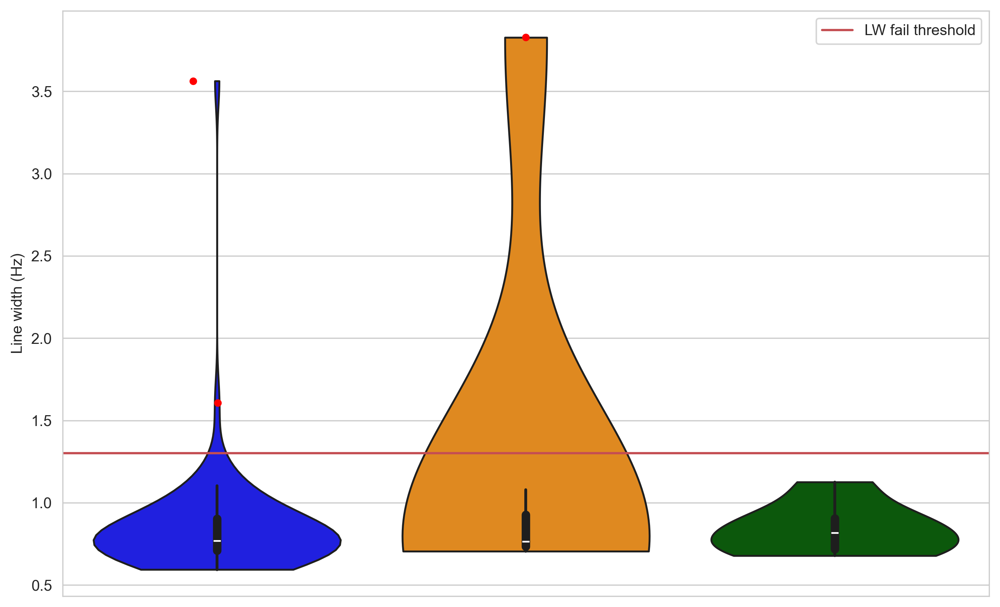

Figure 3: Distribution of all samples around peak on which line width calculated (5-95% with outliers flagged)


Figure 4: Distribution of all samples at baseline regions (5-95% with outliers flagged)


Figure 5: Distribution of all samples at region surrounding solvent suppresion peak (5-95% with outliers flagged)


Table 1: Summary of samples considered for exclusion


,Sample File Name,LineWidthFail,CalibrationFail,BaselineFail,SolventPeakFail
72,ALZ_Urine_Rack01_RCM_221214/230,True,False,False,True
74,ALZ_Urine_Rack01_RCM_221214/290,True,False,True,True
84,ALZ_Urine_Rack01_RCM_221214/310,True,False,False,True
85,ALZ_Urine_Rack01_RCM_221214/40,False,False,False,True


In [13]:
nPYc.reports.generateReport(nmrData,
                            'feature summary')

For example, for this dataset, there is only one sample which fails the quality control criteria on water suppression quality.

Using the interactive plotting function "plotSpectraInteractive" we can plot this spectrum to help decide whether it should indeed be excluded (and potentially re-acquired), or whether the solvent suppresion region for exclusion could be extended and the sample kept in the dataset (see below for an example).

Note. "plotSpectraInteractive" works best with a small number of spectra. The specific samples to plot can be specified by the "samples" argument, here set to plot the first 3 spectra (with indices 0-2) and the samples failing on solvent peak suppression, linewidth and baseline (with indeces 3, 17, 46, 51 - indices given in Table 1 at the end of the feature summary report above). The "sampleLabels" argument allows the user to set the labelling for the spectra, here we use 'Sample File Name', but 'Sample ID' could also be appropriate.

In [19]:
iplot(nPYc.plotting.plotSpectraInteractive(nmrData,
                                           samples=[0, 1, 2, 3, 58, 75],
                                           sampleLabels='Sample File Name'))

By zooming in on the water suppression region, it can be seen that this spectrum has a significantly larger affected region. Depending on the potential value of peaks in this region, the solvent suppression region for exclusion could be extended, however, in order to get back to a normal baseline for this spectrum we would need to cut from 4-5 ppm, as such, in this case, we simply exclude this sample (see the next section).

### Exporting Reports

By default all reports are output directly to the notebook (as above), however, if html copies are required these can be automatically saved to the save directory by adding the optional input argument "destinationPath".

For example, to save to the path defined in "saveDir":  

```
saveDir = '/path to save outputs'
nPYc.reports.generateReport(nmrData, 'feature summary', destinationPath=saveDir)

```

# 5. Exclude Samples and/or Features if Required

Dataset objects contain two internal 'mask' vectors, the 'sampleMask' and 'featureMask', which store whether a sample or feature respectively should be used when calculating QC metrics, visualised in the reports and finally exported, see [Sample and Feature Masks](https://npyc-toolbox.readthedocs.io/en/latest/masks.html).

There are several functions which modify these masks, which are useful at various stages of quality control and in preparing a final dataset for export.

### Mask Samples

The 'updateMasks' function can be used to automatically mask samples (and/or features).

For now, we do not mask any features, setting "filterFeatures=False".

By default, any samples of unknown 'SampleType' and/or 'AssayRole' will be masked.

In addition, samples failing specific quality control measures (as described above) can be masked by specifying one or more QC parameters to apply in "sampleQCChecks". To mask all samples failing on any quality control parameter, "sampleQCChecks" would be set to:

```
sampleQCChecks = ['LineWidthFail', 'CalibrationFail', 'BaselineFail', 'SolventPeakFail']
```

In this case, as only one sample is failing on 'SolventPeakFail', this sample could be masked using the following:

```
nmrData.updateMasks(filterSamples=True, sampleQCChecks=['SolventPeakFail'], filterFeatures=False)
```

Here, by additionally setting preferences with the "sampleTypes" and "assayRoles" arguments, any other samples which are not required can also be masked. In this example, we limit our dataset to study samples ('SampleType.StudySample, AssayRole.Assay') and study reference samples ('SampleType.StudyPool, AssayRole.PrecisionReference') by running the following (see [Sample and Feature Masks](https://npyc-toolbox.readthedocs.io/en/latest/masks.html) and [Enumerations](https://npyc-toolbox.readthedocs.io/en/latest/enumerations.html) for more details).

As we describe feature masking in the next section, here, we can set "filterFeatures=False".

In [15]:
nmrData.updateMasks(sampleQCChecks=['SolventPeakFail', 'LineWidthFail', 'BaselineFail'],
                    sampleTypes=[SampleType.StudySample, SampleType.StudyPool],
                    assayRoles=[AssayRole.Assay, AssayRole.PrecisionReference],
                    filterFeatures=False)

The results of masking can be summarised using the 'sample summary' report.

In [16]:
nPYc.reports.generateReport(nmrData, 'sample summary')

Summary of Samples Acquired


,Total,Marked for Exclusion,Missing/Excluded
All,90,10,4
Study Sample,76,3,4
Study Reference,7,0,0
Long-Term Reference,7,7,0




Samples Missing from Acquisition/Import (i.e., present in metadata file but not acquired/imported)


,Sample File Name,Sample ID,Exclusion Details
12,ALZ_Urine_Rack01_RCM_221214/130,OA0479_U,Compromised sample
15,ALZ_Urine_Rack01_RCM_221214/160,DCR00220_U,Compromised sample
66,ALZ_Urine_Rack01_RCM_221214/670,DCR00069_U,Compromised sample
69,ALZ_Urine_Rack01_RCM_221214/700,PRGM0010_U,Compromised sample




Samples Marked for Exclusion


,Sample File Name,Exclusion Details
4,ALZ_Urine_Rack01_RCM_221214/900,
6,ALZ_Urine_Rack01_RCM_221214/730,
17,ALZ_Urine_Rack01_RCM_221214/880,
28,ALZ_Urine_Rack01_RCM_221214/860,
38,ALZ_Urine_Rack01_RCM_221214/940,
72,ALZ_Urine_Rack01_RCM_221214/230,SolventPeakFail + LineWidthFail
74,ALZ_Urine_Rack01_RCM_221214/290,SolventPeakFail + LineWidthFail + BaselineFail
77,ALZ_Urine_Rack01_RCM_221214/920,
84,ALZ_Urine_Rack01_RCM_221214/310,SolventPeakFail + LineWidthFail
85,ALZ_Urine_Rack01_RCM_221214/40,SolventPeakFail




Samples Missing/Excluded


,Sample File Name,Sample ID,Exclusion Details
0,ALZ_Urine_Rack01_RCM_221214/130,OA0479_U,Compromised sample
1,ALZ_Urine_Rack01_RCM_221214/160,DCR00220_U,Compromised sample
2,ALZ_Urine_Rack01_RCM_221214/670,DCR00069_U,Compromised sample
3,ALZ_Urine_Rack01_RCM_221214/700,PRGM0010_U,Compromised sample


### Mask Features

For NMR datasets, typically one or more sections of the spectra known to contain unwanted or un-informative signals are removed from the data (see [Sample and Feature Masks](https://npyc-toolbox.readthedocs.io/en/latest/masks.html)).

This can be done automatically using the 'updateMasks' function.

The standard regions automatically masked are defined in the configuration SOP, see the 'NMRDataset Objects' table in [Built-in Configuration SOPs](https://npyc-toolbox.readthedocs.io/en/latest/configuration/builtinSOPs.html). For example, the default exclusion regions for urine are between -0.2 and 0.2 ppm (TSP) and between 4.7 and 4.9 ppm (water presaturation region).

As the sample mask has been specified in the previous section, here we set "filterSamples=False".

In [17]:
nmrData.updateMasks(filterSamples=False,
                    filterFeatures=True)

To mask a larger region around the water presaturation signal (between 4.5 and 5.0 ppm) the data could be imported with an updated "exclusionRegions" parameter:

```
nmrData = nPYc.NMRDataset(rawDataPath, pulseProgram=pulseProgram, sop=sop, exclusionRegions=[[-0.2,0.2],[4.5,5.0]])
```

Also, additional regions can also be masked by using 'updateMasks' with the additional "exclusionRegions" parameter. For example, to additionally mask the region between 8.4 and 8.5 ppm the following would be run:

```
nmrData.updateMasks(filterSamples=False, filterFeatures=True, exclusionRegions=[(8.4, 8.5)])
```

The results of masking can be visualised using the 'feature summary' report.

Using "withExclusions=True" means the report is generated as if any masked features were excluded from the dataset, which allows assessment of the results of filtering before the features are permanently excluded from the dataset.

Figure 1: Distribution of all samples after chemical shift calibration (5-95% with outliers flagged)


Figure 2: Boxplot of line width values (coloured by sample type)


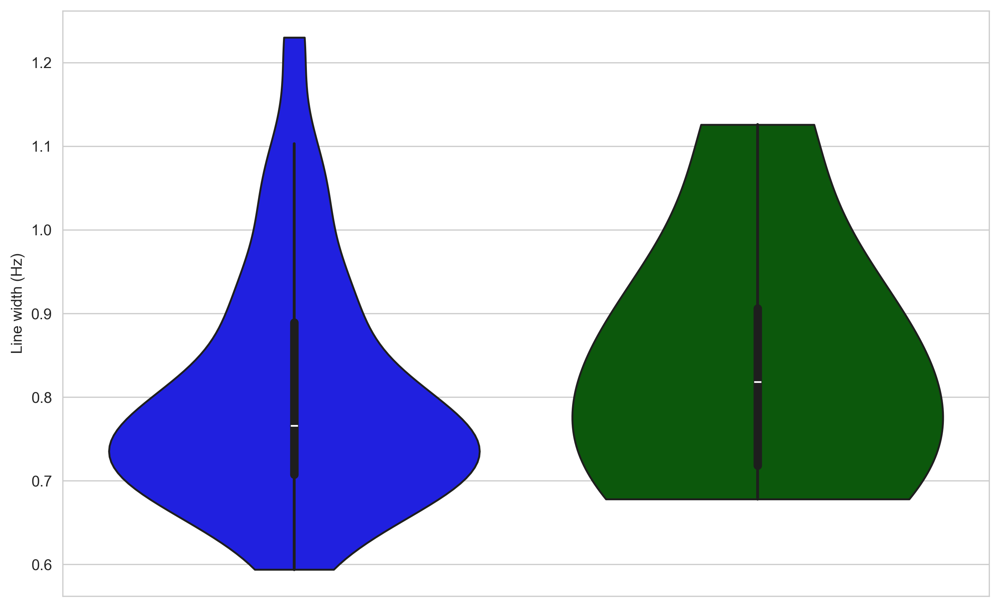

Figure 3: Distribution of all samples around peak on which line width calculated (5-95% with outliers flagged)


Figure 4: Distribution of all samples at baseline regions (5-95% with outliers flagged)


Figure 5: Distribution of all samples at region surrounding solvent suppresion peak (5-95% with outliers flagged)


Table 1: Summary of samples considered for exclusion


,Sample File Name,LineWidthFail,CalibrationFail,BaselineFail,SolventPeakFail
58,ALZ_Urine_Rack01_RCM_221214/840,False,False,False,True
75,ALZ_Urine_Rack01_RCM_221214/780,False,False,False,True


In [18]:
nPYc.reports.generateReport(nmrData,
                            'feature summary',
                            withExclusions=True)

### Excluding Specific Samples and/or Features

The 'updateMasks' function works to mask samples or features not meeting specific criteria, in addition to this, the nPYc-Toolbox also contains two additional methods to mask specific samples or features directly, 'excludeSamples' and 'excludeFeatures' respectively, see [Sample and Feature Masks](https://npyc-toolbox.readthedocs.io/en/latest/masks.html).

Each of these funtions takes three input arguments; firstly, a list of sample or feature identifiers; secondly, the name of the column in 'sampleMetadata' (for 'excludeSamples') or 'featureMetadata' (for 'excludeFeatures') where these identifiers can be found; and finally an optional message as to why these samples or features have been flagged for exclusion.

For example, to exclude the sample of unknown type with 'Sample File Name' 'DEVSET U 1D NMR raw data files/930':

```
nmrData.excludeSamples(['DEVSET U 1D NMR raw data files/930'], on='Sample File Name', message='Unknown type')
```

Or to exclude all features with 'ppm' > 8:

```
nmrData.excludeFeatures([nmrData.featureMetadata['ppm'][nmrData.featureMetadata['ppm'] > 8].values], on='ppm', message='ppm > 8')
```

### Permanently Exclude Masked Samples/Features

Once satisfied with the sample and feature masks, exclusions can be applied (permanently removed from the dataset) using the 'applyMasks' function.

This method should be used only when it is absolutely certain that the masked features and samples are to be removed, as the excluded data will otherwise have to be re-imported.

Before masks have been applied, however, feature/sample masking can be changed by first re-setting the masks to include all samples/features:

```
nmrData.initialiseMasks()
```

Then different feature/sample exclusions can be applied as required.

For details see [Sample and Feature Masks](https://npyc-toolbox.readthedocs.io/en/latest/masks.html).

In this case we are happy with the masking, and so features and samples can be permanently excluded using:

In [20]:
nmrData.applyMasks()

# 6. Analytical Multivariate Quality Control

The nPYc-Toolbox provides the capacity to generate a principal component analysis (PCA) model of the data (via the [pyChemometrics](https://github.com/phenomecentre/pyChemometrics) module), and subsequently, to use this to assess data quality, identify potential sample and feature outliers, and determine any potential analytical associations with the main sources of variance in the data ([Multivariate Analysis](https://npyc-toolbox.readthedocs.io/en/latest/multivariate.html))

A PCA model can be generated using 'exploratoryAnalysisPCA', and there are a number of parameters which can be optimised depending on the dataset (see [PCA Model](https://npyc-toolbox.readthedocs.io/en/latest/multivariate.html#pca-model) for full details).

One key parameter is 'scaling', which divides each column in the data matrix by its respective standard deviation raised to a power of the scaling parameter. This parameter can range in value between 0 and 1, and recommended values are 0 for mean-centering only, 0.5 for Pareto scaling and 1 for unit variance (UV) scaling. The outcome of PCA model will vary based on the scaling method selected, and different scaling functions can be appropriate depending on the data itself and the question being asked of the data, see [van der Berg et al. 2006](https://www.ncbi.nlm.nih.gov/pubmed/16762068)

The default scaling is unit variance ("scaling=1"), which scales every variable to have a variance of one, and thus all variables (despite their different magnitudes) become equally important in the model. For NMR, when smaller variables are more likely to be background noise, it may be that mean-centering the data only ("scaling=0") can be appropriate.

Each model is cross-validated using 7-fold cross-validation and the recommended number of principal components automatically estimated based on two criteria, when either one of these is met no more components will be added and the PCA model will be returned. There criteria are:
1. "minQ2": Q2 is the variance predicted by each component (from cross-validation), when adding a component does not improve Q2 by at least this value (default "minQ2=0.05") then no more components will be added.
2. "maxComponents": this defines the maximum number of components (default "maxComponents=10") returned by the model (regardless of Q2 increases).

Again these parameters can be amended by adding them as input arguments to 'exploratoryAnalysisPCA'.

In [21]:
PCAmodel = nPYc.multivariate.exploratoryAnalysisPCA(nmrData,
                                                    scaling=0)

The analytical multivariate report provides visualisations summarising the largest sources of variance in the dataset (from the PCA model generated) with particular emphasis on any potential analytical sources, as defined in 'analyticalMeasurements' in the [Built-in Configuration SOPs](https://npyc-toolbox.readthedocs.io/en/latest/configuration/builtinSOPs.html).

These consist of:
- Scree plot of variance (Figure 1)
- Scores plots coloured by sample type (Figure 2)
- Strong sample outliers (Figure 3)
- DmodX sample outliers (Figure 4)
- Loadings plots (Figure 5)
- Distribution of analytical parameters (Figure 6)
- Heatmap of potential associations between analytical parameters and the main sources of variance (Figures 7 and 8)
- Scores plots coloured by analytical parameters with potential association (Figures 9-11)

For full details of each of the above, see [Multivariate Analysis Report](https://npyc-toolbox.readthedocs.io/en/latest/multivariate.html#multivariate-analysis-report)

Dataset

Original data consists of 80 samples and 18910 features
	73 Study Samples
	7 Study Reference Samples
	0 Long-Term Reference Samples
	0 Other Samples

PCA Analysis

PCA Model Parameters
	Normalisation method: No normalisation applied.
	Scaling: mc
	Number of components: 4
	Critical value for flagging outliers in DmodX space: None
	Critical value for flagging outliers in scores space: None

PCA QC Outputs

Figure 1: PCA scree plot of variance explained by each component (cumulative)


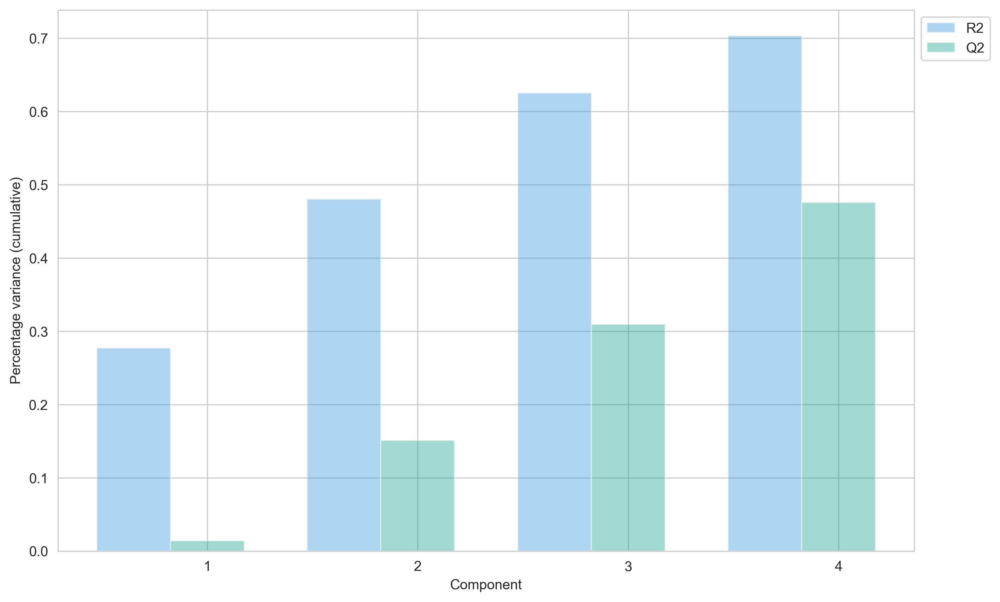



Figure 2: PCA scores plots coloured by sample type.


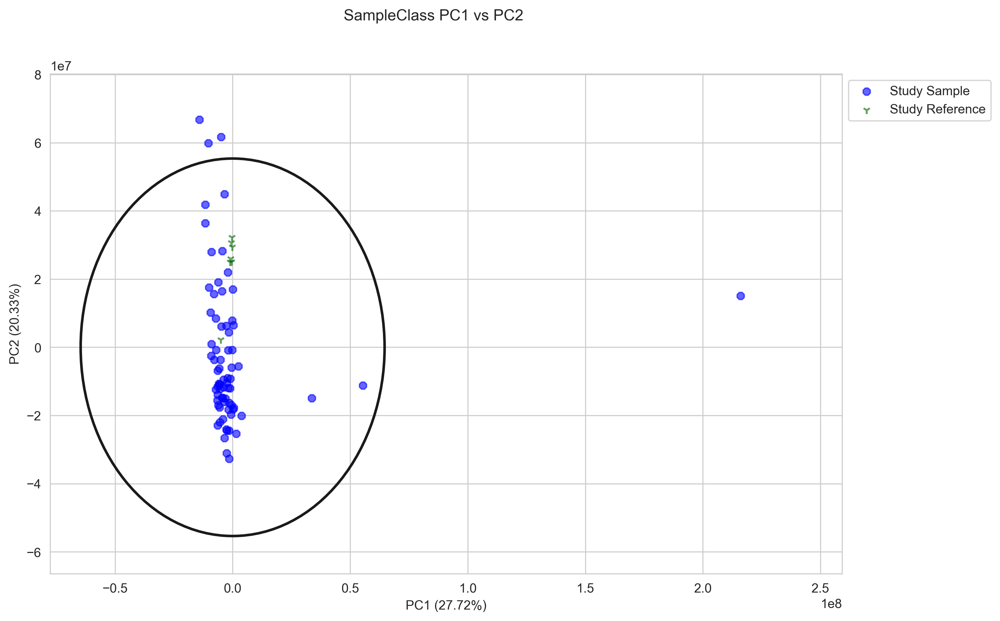

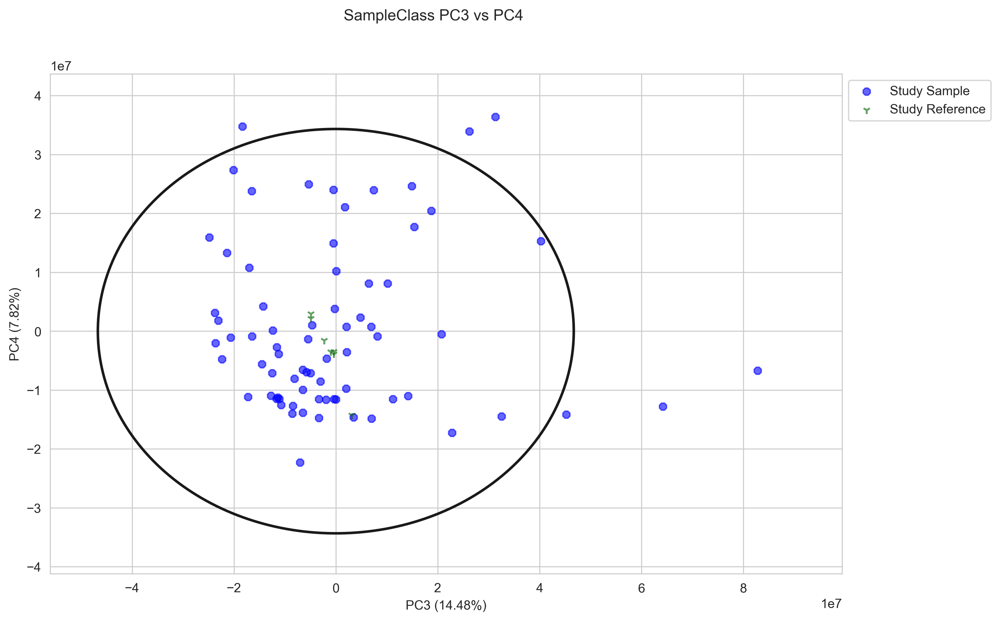



Figure 3: Distribution in total distance from origin (scores space) by sample type.


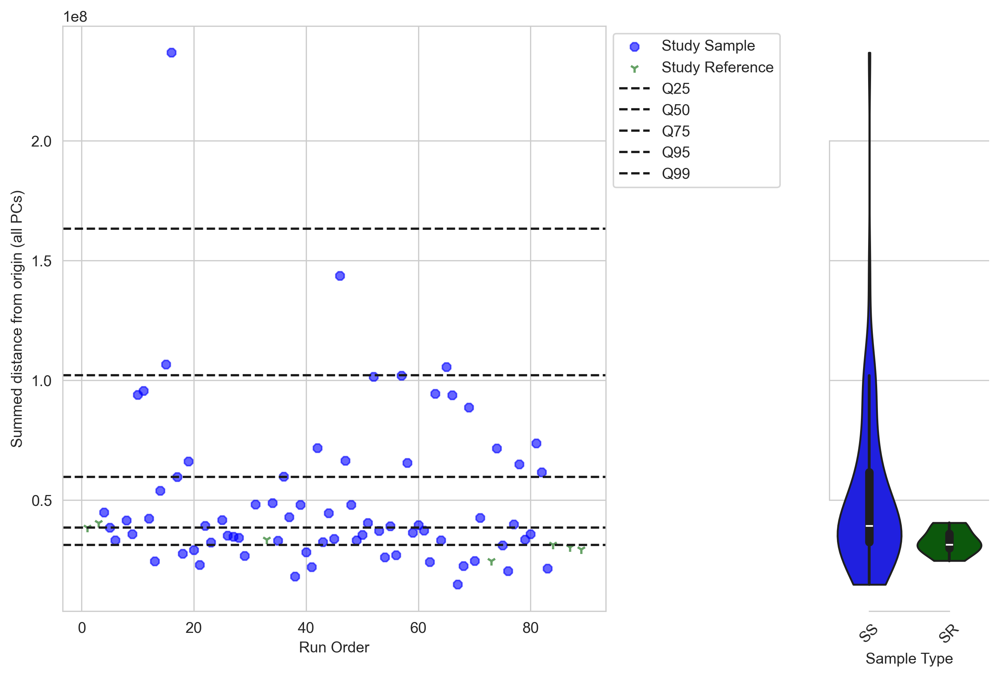



Figure 4: Distribution in distance from model (DmodX) by sample type.


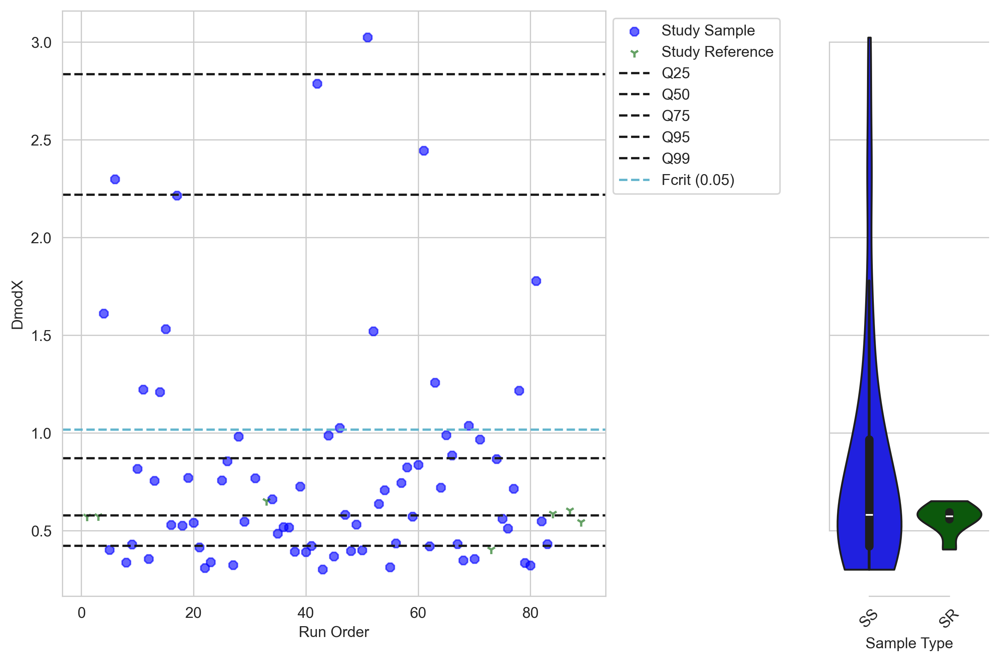



Figure 5: PCA loadings plots.


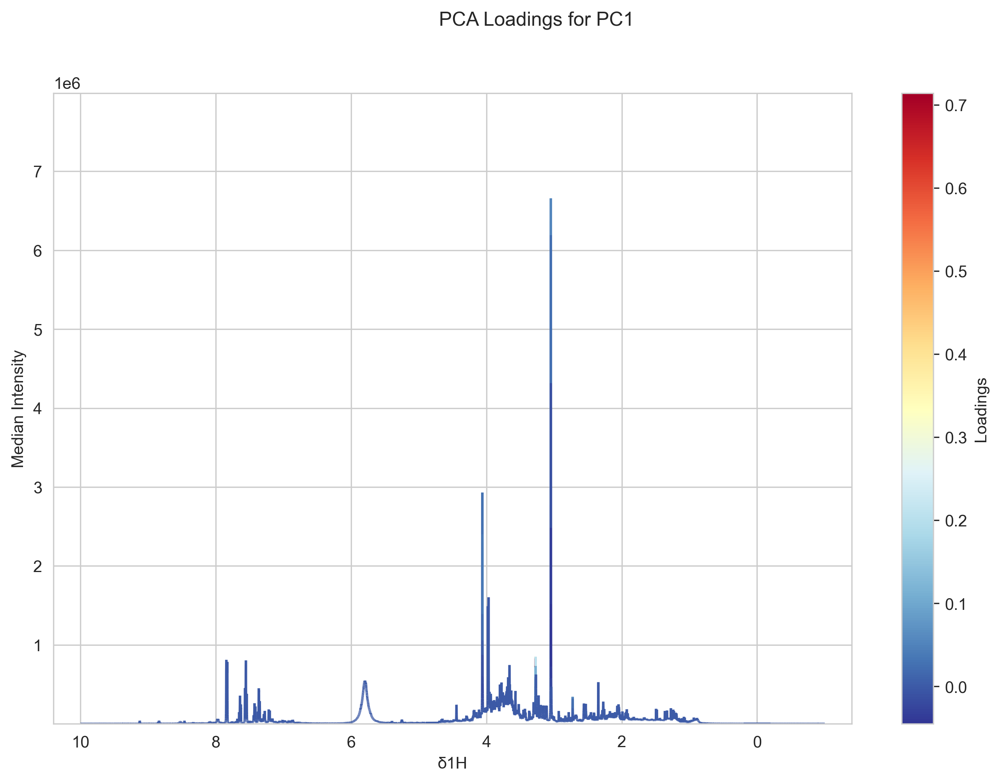

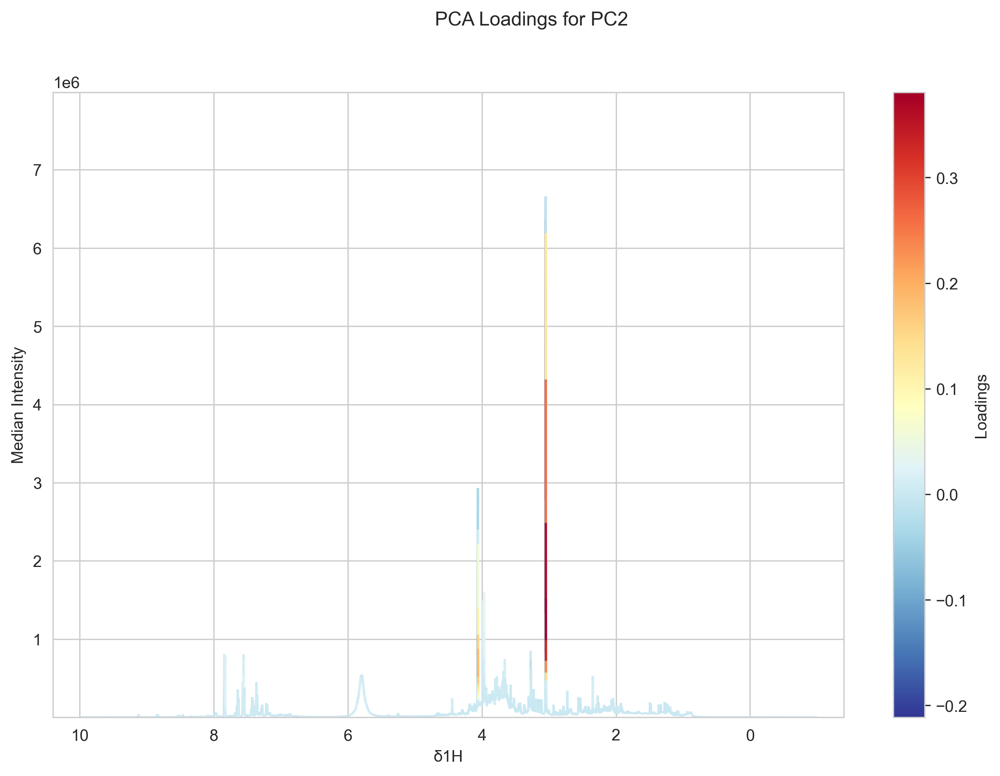

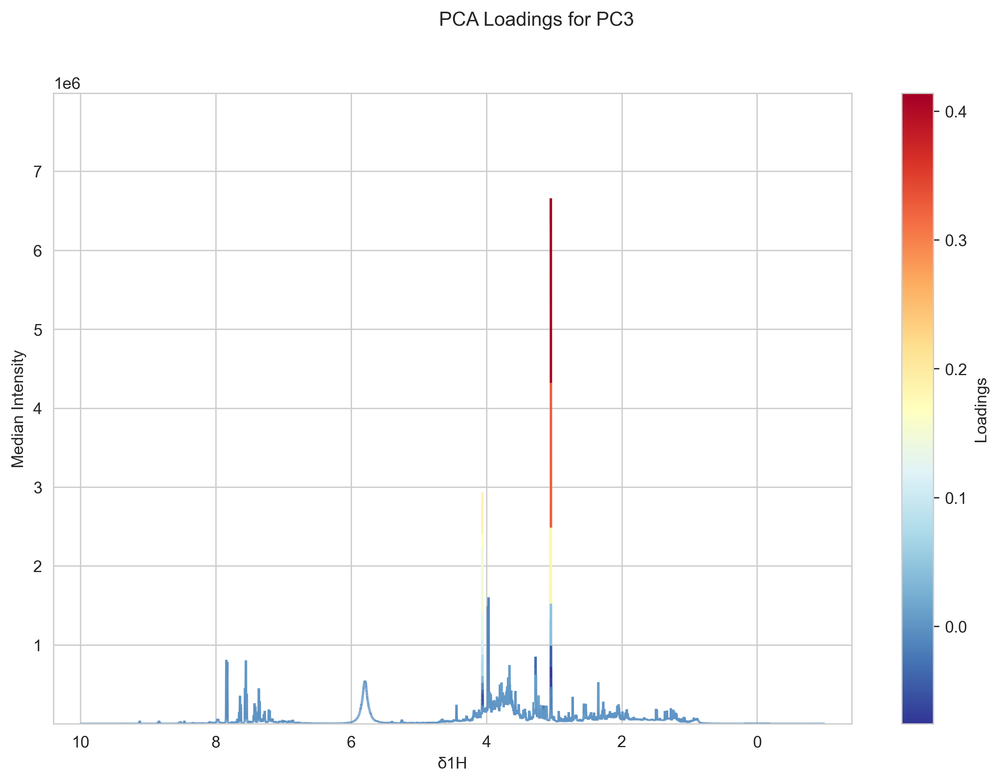

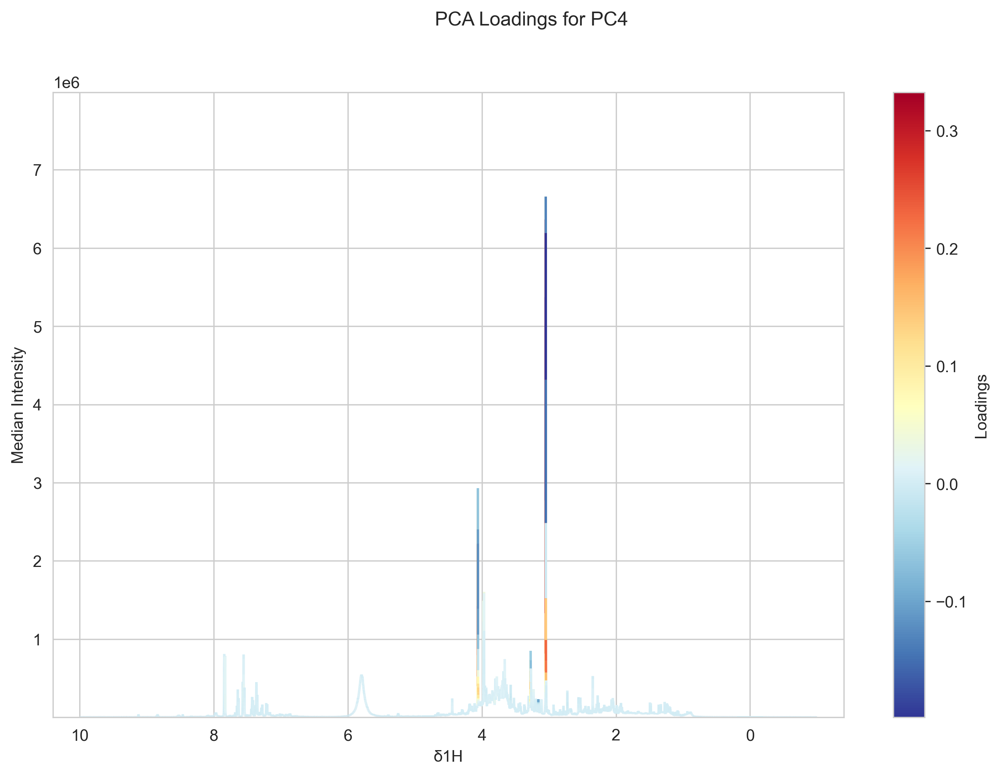


Distribution of Values in each Metadata Field

Figure 6: Distribution of values in each metadata field (plotted for fields with non-uniform values only).

Continuous data.


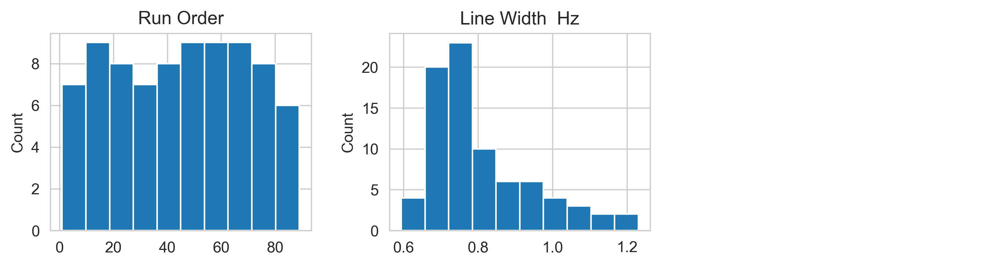

Date data.


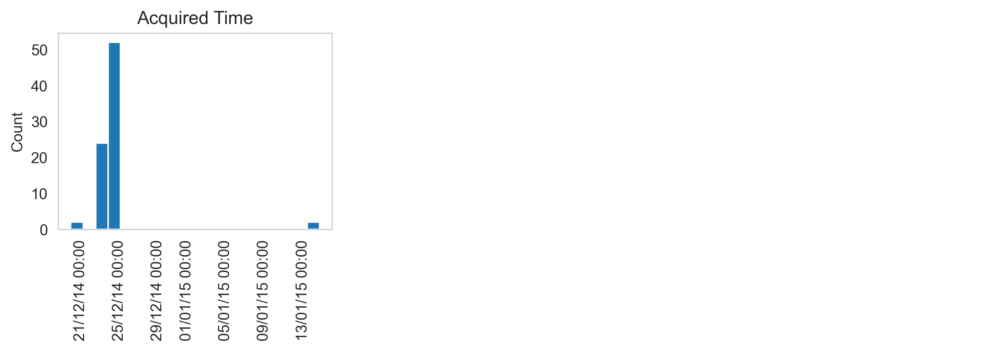



Association of PCA Scores with Metadata

Calculations Performed

Total number of metadata fields: 11
	Number of fields where correlation to PCA scores calculated: 2
	Number of fields where Kruskal-Wallis test between groups in PCA scores calculated: 0
	Number of fields with date values: 1
	Number of fields where insufficent sample numbers to estimate significance: 0
	Number of fields with uniform class for all samples: 8
	Number of fields with uniform class for all samples with same sample type: 0
	Number of fields with unique non-numeric values for all samples in class: 0
	Number of fields excluded from calculations: 0

	Correlation threshold for plotting: 0.3
	Kruskal-Willis p-value threshold for plotting: 0.05


Figure 7: Heatmap of correlation to PCA scores for suitable metadata fields.


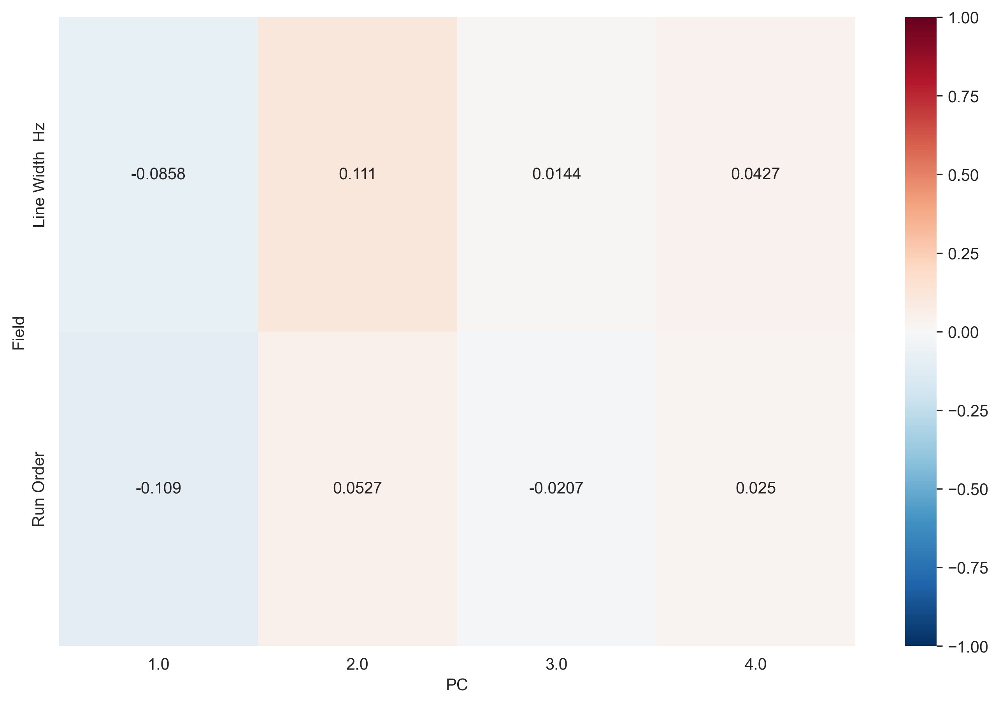



Figure 8: Heatmap of Kruskal-Wallis Test against PCA scores for suitable metadata fields.

0 fields where Kruskal-Wallis test between groups in PCA scores calculated.


Figure 9: PCA scores plots coloured by metadata (significance by correlation).

0 fields where correlation coefficient to PCA scores exceeded threshold of 0.3


Figure 10: PCA scores plots coloured by metadata (significance by Kruskal-Wallis).

0 fields where Kruskal-Wallis p-value against PCA scores exceeded threshold of 0.05


Figure 11: PCA scores plots coloured by metadata (insufficent sample numbers to estimate significance).

0 fields where insufficent sample numbers to estimate significance.


In [22]:
nPYc.reports.multivariateReport(nmrData,
                                PCAmodel)

Since the SR samples cluster tightly in the PCA scores plots, and no strong associations are observed in the heatmaps between analytical parameters and samples scores (main sources of variance in the data), we can conclude that the data is of high quality, and ready to be exported.

### Interactive Plots

Scores and loadings plots can also be explored interactively with the 'plotScoresInteractive' and 'plotLoadingsInteractive' functions.

**Interactive scores plot**

For example, to plot the scores plot for principal component 1 vs. principal component 2 ("components=[1, 2]") with points coloured by values in nmrData.sampleMetadata['Class'] (the colour is defined by the third input argument and can be any column name in the sample metadata):

In [23]:
data = nPYc.plotting.plotScoresInteractive(nmrData,
                                           PCAmodel,
                                           colourBy='SampleClass',
                                           labelBy='Sample ID',
                                           components=[1, 2])
iplot(data)

Here, 'Class' gives information on which sample the spectra relate to (see 'DEVSET U 1D NMR Basic CSV.csv' and [Tutorial Datasets](https://npyc-toolbox.readthedocs.io/en/latest/tutorial.html#tutorial-datasets) for full details). Spectra from multiple acquisitions of the same sample cluster strongly, with the 'Study Pool' (Study Reference QC samples) clustering in the centre of the plot and clear separation can be seen between the different samples.

**Interactive loadings plot**

Similarly, to plot the loadings, here for principal component 2:

In [24]:
data = nPYc.plotting.plotLoadingsInteractive(nmrData,
                                             PCAmodel,
                                             component=2)
iplot(data)

# 7. Finalise and Export Dataset

Once no further exclusions or preprocessing is required, the final dataset can be exported.

The 'final report' compiles information about the samples acquired, and the overall quality of the dataset taking key figures from feature and multivariate reports to give an overall summary:

Final Dataset

80 samples
18910 features

Sample Summary

Table 1: Summary of samples present.


,Total,Missing/Excluded
All,80,14
Study Sample,73,7
Study Reference,7,0



Details of any missing/excluded study samples given at the end of the report

Spectral Data

Table 2: Data processed with the following criteria:


,Value Applied
Referenced to (ppm),0
Spectral Resolution (points),20000
Baseline Region Checked (ppm),"[[-2, -0.5], [9.5, 12.5]]"
Solvent Suppresion Region Checked (ppm),"[[4.6, 4.7], [4.9, 5]]"
Line Width: Calculated on,"[-0.1, 0.1]"
Line Width: Peak Multiplicity,singlet
Line Width: Threshold (Hz),1.3
Spectral Regions Automatically Removed (ppm),"[[-0.2, 0.2], [4.7, 4.9]]"



Samples acquired between Dec 19 2014 and Jan 14 2015

Figure 1: Boxplot of line width distributions (by sample type).


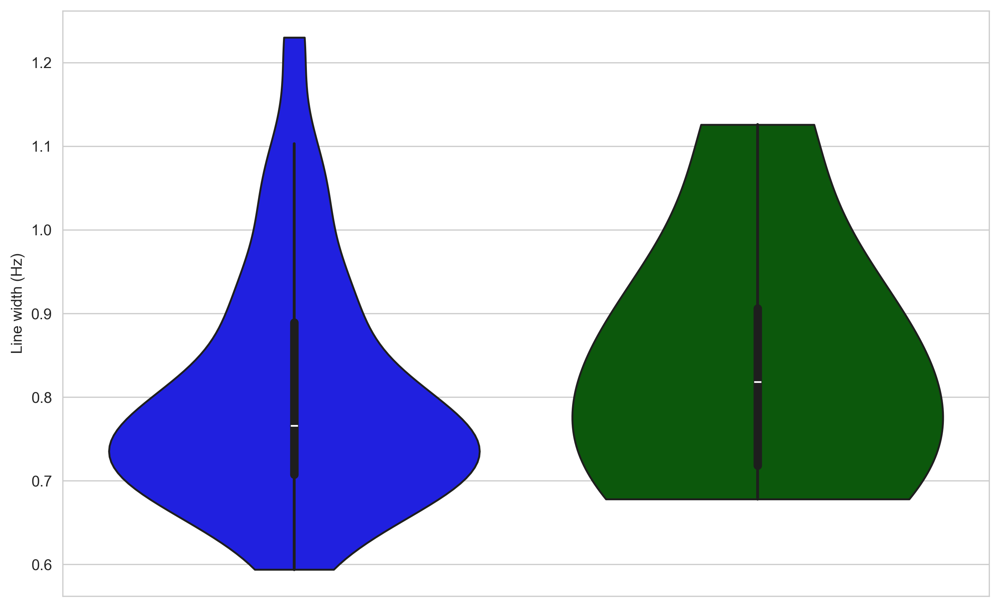

Figure 2: Distribution in intensity of spectral data around the removed solvent peak region.


Figure 3: PCA scores plots coloured by sample class.


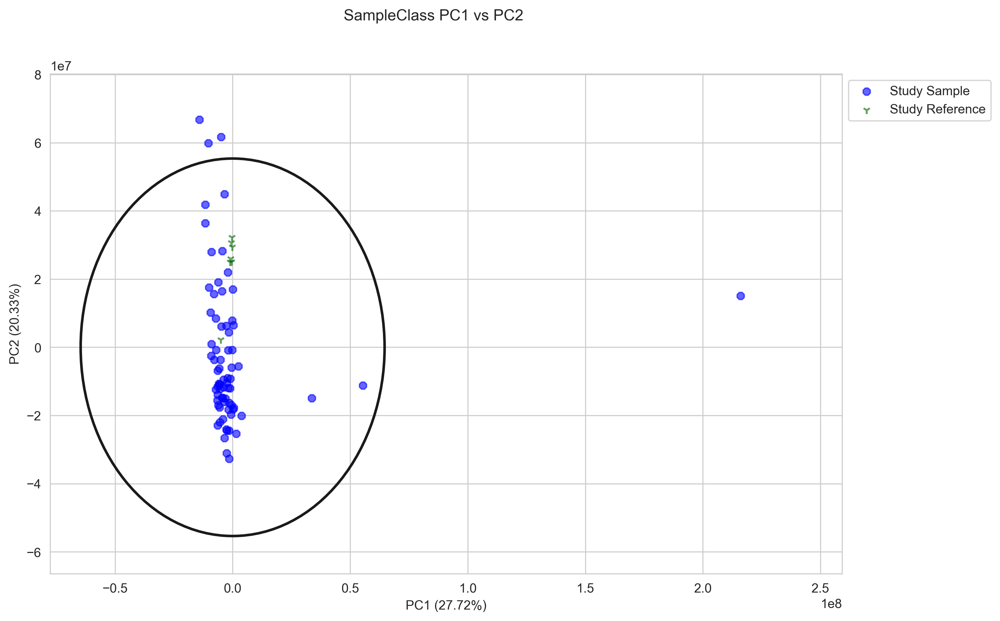

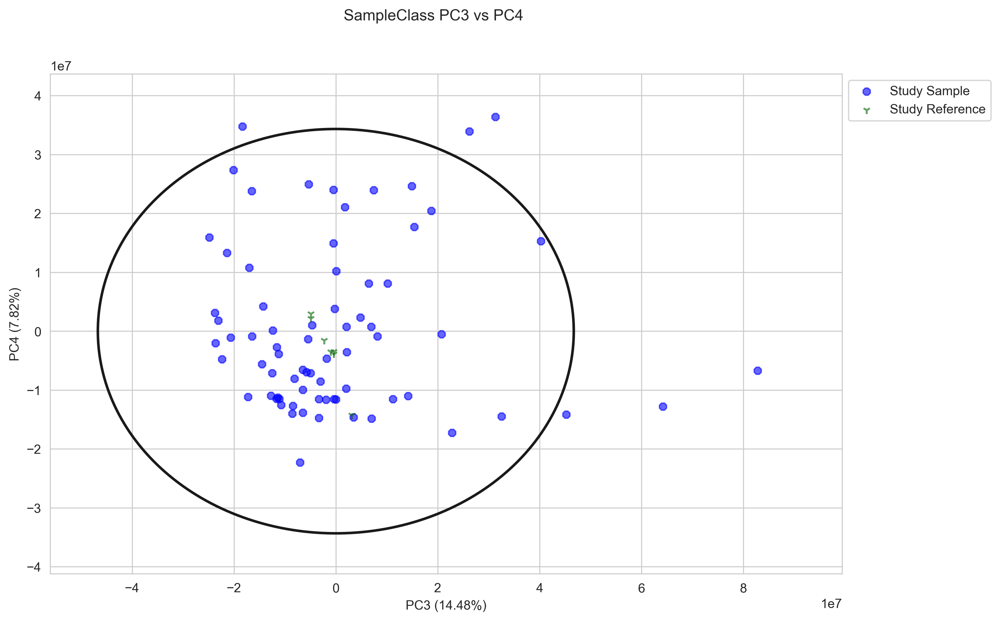



Figure 4: PCA loadings plots.


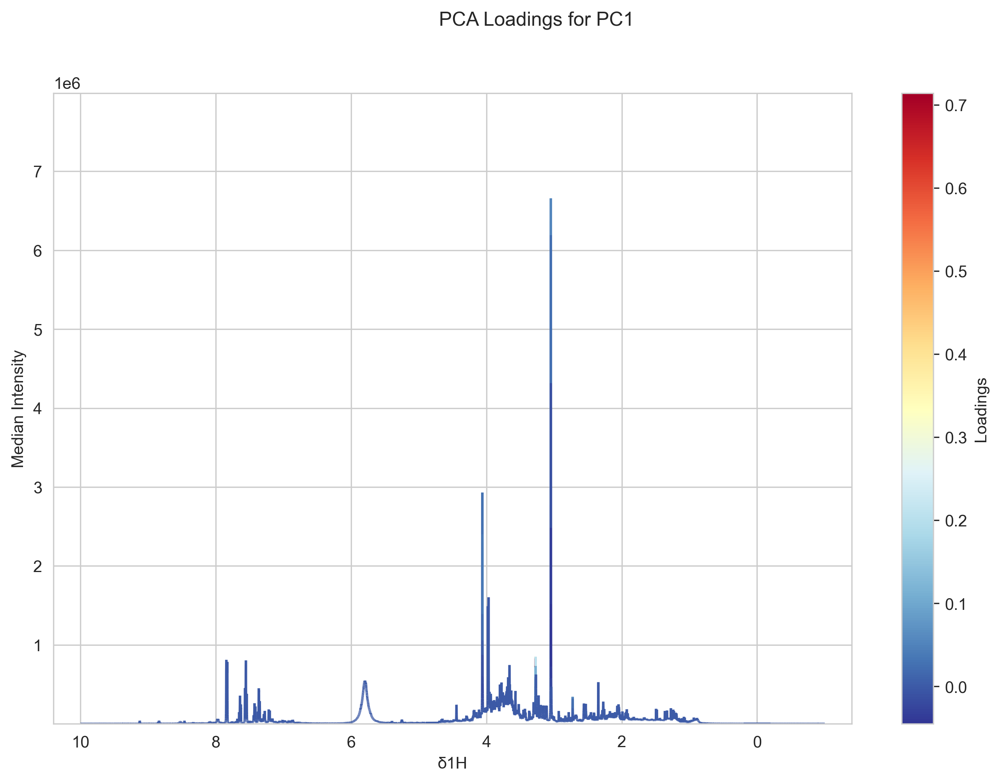

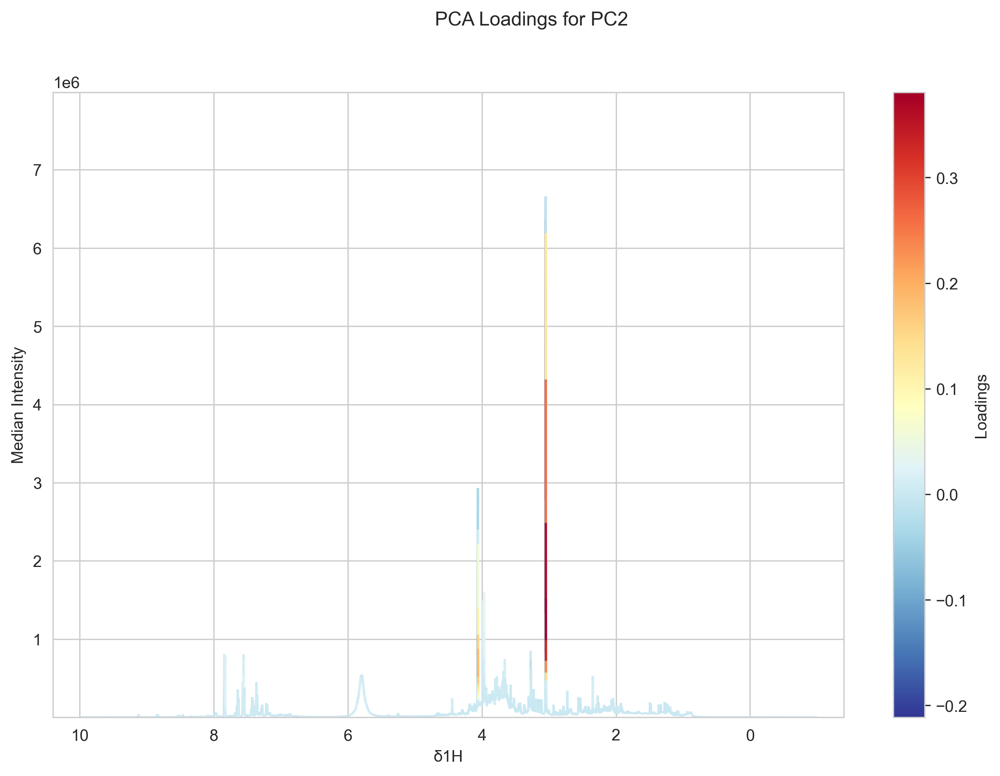

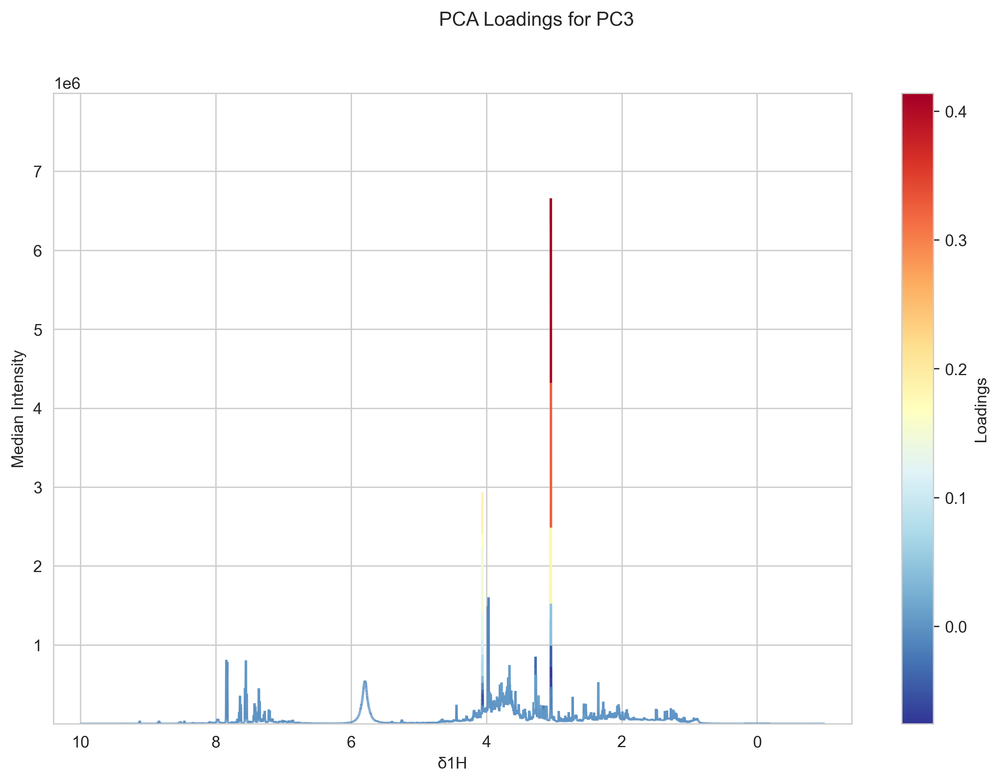

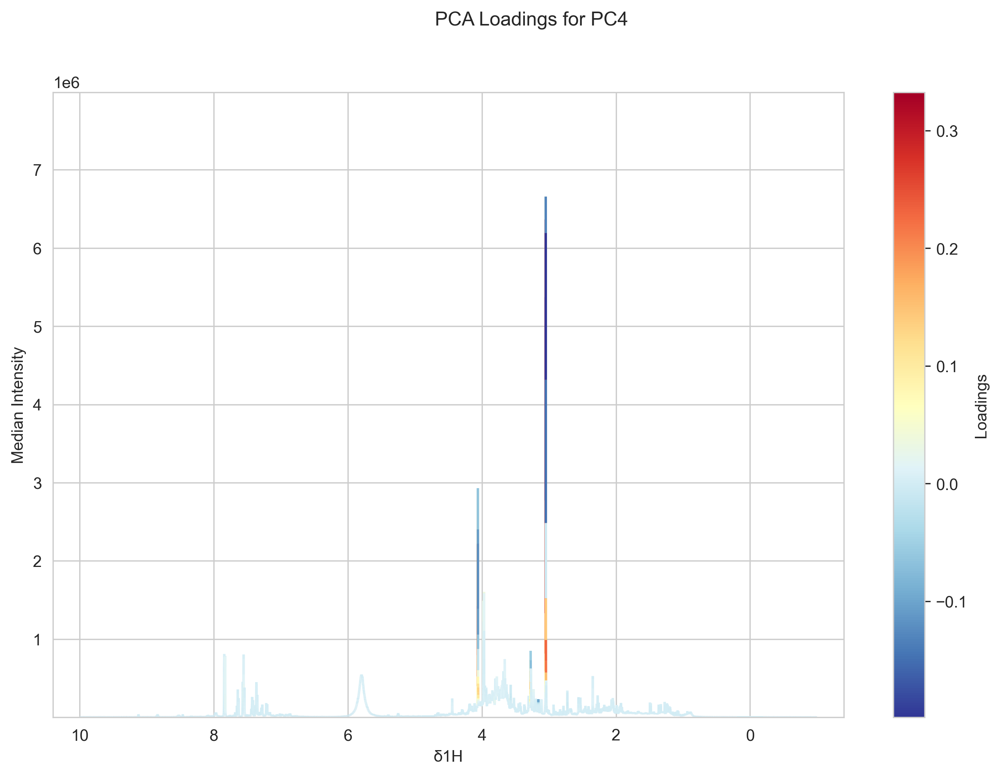

Missing/Excluded Study Samples

Table 3: Details of missing/excluded study samples


,Sample File Name,Sample ID,Exclusion Details
0,ALZ_Urine_Rack01_RCM_221214/230,THSM0058_U,SolventPeakFail + LineWidthFail
1,ALZ_Urine_Rack01_RCM_221214/290,PRGA0019_U,SolventPeakFail + LineWidthFail + BaselineFail
2,ALZ_Urine_Rack01_RCM_221214/40,KPOC0007_U,SolventPeakFail
3,ALZ_Urine_Rack01_RCM_221214/130,OA0479_U,Compromised sample
4,ALZ_Urine_Rack01_RCM_221214/160,DCR00220_U,Compromised sample
5,ALZ_Urine_Rack01_RCM_221214/670,DCR00069_U,Compromised sample
6,ALZ_Urine_Rack01_RCM_221214/700,PRGM0010_U,Compromised sample


In [25]:
nPYc.reports.generateReport(nmrData,
                            'final report',
                            pcaModel=PCAmodel)

Subsequently, datasets can be exported in a variety of formats with the 'exportDataset' method (see [Exporting Data](https://npyc-toolbox.readthedocs.io/en/latest/exportingdata.html)).

By default datasets are exported to the current working directory, however, if files are required to be exported to a defined path, this can be done by adding the optional input argument "destinationPath".

For example, to save to the path defined in "saveDir":  

```
saveDir = '/path to save outputs'
nmrData.exportDataset(saveFormat='UnifiedCSV', destinationPath=saveDir)

```

To export a single CSV file, which contains a row for every sample, and a column for every feature, alongside all of the sample and feature specific metadata, set "saveFormat=UnifiedCSV".

In [26]:
# Default export results in production of three separate CSV files:
#nmrData.exportDataset(destinationPath='.')

# Export all data and info in a single CSV file:
nmrData.exportDataset(saveFormat='UnifiedCSV',
                      destinationPath='.')

Finally, to export the 'final report':

In [27]:
nPYc.reports.generateReport(nmrData,
                            'final report',
                            pcaModel=PCAmodel,
                            destinationPath='.')

# 8. OPTIONAL: Normalise Data and Export

Dilution effects on global sample intensity can be normalised by using one of the available [Normalisation classes](https://npyc-toolbox.readthedocs.io/en/latest/normalisation.html).

This is especially critical in urine samples when samples can vary substantially in concentration. Here we apply Probabilistic Quotient Normalisation (PQN) [Deterle et al. 2006](https://pubs.acs.org/doi/10.1021/ac051632c).

Setting the 'Normalisation' parameter in msDataCorrected automatically applies the selected normalisation.

In [28]:
nmrData.Normalisation = ProbabilisticQuotientNormaliser()

And the normalised data exported (here we first change the name for clarity and so as not to overwrite existing data):

In [29]:
# Append name
nmrData.name = nmrData.name + '_PQN_normalised'

# Export dataset
nmrData.exportDataset(saveFormat='UnifiedCSV',
                      destinationPath='.')

# Export final summary report
nPYc.reports.generateReport(nmrData,
                            'final report',
                            destinationPath='.')